<a href="https://colab.research.google.com/github/Nastarii/Action-Patterns-Recognition/blob/main/Action_Patterns_Recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Action Patterns Recognition

--- Environment informations ---

## 1. Introduction

In [1]:
from google.colab import drive

drive.mount('./drive')

Mounted at ./drive


### 1.1 Libraries

In [ ]:
!pip install tensorflow==2.4.1 tensorflow-gpu==2.4.1 tensorflow-hub opencv-python matplotlib

In [2]:
!pip install -q imageio-ffmpeg

     |████████████████████████████████| 26.9 MB 1.7 MB/s 


In [ ]:
from IPython.display import HTML, display
from tensorflow_docs.vis import embed
from matplotlib import pyplot as plt

import tensorflow_hub as hub
import tensorflow as tf
import numpy as np
import imageio
import cv2

In [33]:
from matplotlib import rc
rc('animation', html='jshtml')
import matplotlib.animation as animation

In [8]:
from matplotlib.patches import Rectangle
from mpl_toolkits.mplot3d import Axes3D

import matplotlib.pyplot as plt
import tensorflow as tf
import imageio
import os

### 1.2 Movenet

#### 1.2.1 Load Hub

In [ ]:
model = hub.load('https://tfhub.dev/google/movenet/multipose/lightning/1')
movenet = model.signatures['serving_default']

#### 1.2.2 Utils

In [ ]:
def to_gif(images, fps):
  """Converts image sequence (4D numpy array) to gif."""
  imageio.mimsave('./animation.gif', images, fps=fps)
  return embed.embed_file('./animation.gif')

In [ ]:
def progress(value, max=100):
  return HTML("""
      <progress
          value='{value}'
          max='{max}',
          style='width: 100%'
      >
          {value}
      </progress>
  """.format(value=value, max=max))

In [ ]:
# Function to loop through each person detected and render
def loop_through_people(frame, keypoints_with_scores, edges, confidence_threshold):
    for person in keypoints_with_scores:
        draw_connections(frame, person, edges, confidence_threshold)
        draw_keypoints(frame, person, confidence_threshold)

In [ ]:
def draw_keypoints(frame, keypoints, confidence_threshold):
    y, x, c = frame.shape
    shaped = np.squeeze(np.multiply(keypoints, [y,x,1]))
    
    for kp in shaped:
        ky, kx, kp_conf = kp
        if kp_conf > confidence_threshold:
            cv2.circle(frame, (int(kx), int(ky)), 2, (255,255,255), 1)

In [ ]:
EDGES = {
    (0, 1): 'm',
    (0, 2): 'c',
    (1, 3): 'm',
    (2, 4): 'c',
    (0, 5): 'm',
    (0, 6): 'c',
    (5, 7): 'm',
    (7, 9): 'm',
    (6, 8): 'c',
    (8, 10): 'c',
    (5, 6): 'y',
    (5, 11): 'm',
    (6, 12): 'c',
    (11, 12): 'y',
    (11, 13): 'm',
    (13, 15): 'm',
    (12, 14): 'c',
    (14, 16): 'c'
}

In [ ]:
def draw_connections(frame, keypoints, edges, confidence_threshold):
    y, x, c = frame.shape
    shaped = np.squeeze(np.multiply(keypoints, [y,x,1]))
    
    for edge, color in edges.items():
        p1, p2 = edge
        y1, x1, c1 = shaped[p1]
        y2, x2, c2 = shaped[p2]
        
        if (c1 > confidence_threshold) & (c2 > confidence_threshold):      
            cv2.line(frame, (int(x1), int(y1)), (int(x2), int(y2)), (222,222,222), 1)

#### 1.2.3 Run inference

In [ ]:
!wget -q -O dance.gif https://media2.giphy.com/media/QpWDP1YMziaQw/giphy.gif?cid=790b7611c5cc011c3371b0626a0fbbffb8adb671618a978c&rid=giphy.gif&ct=g

In [ ]:
image_path = 'dance.gif'
image = tf.io.read_file(image_path)
image = tf.image.decode_gif(image)


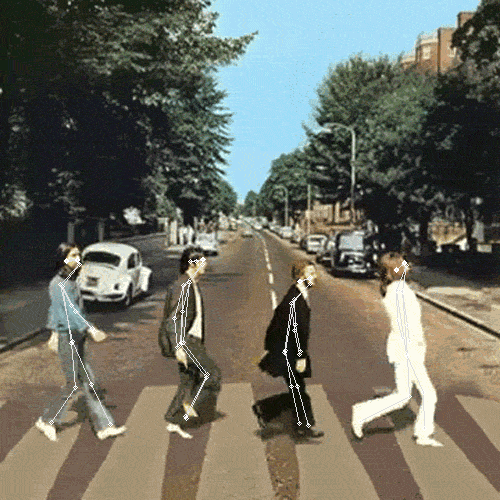

In [ ]:
num_frames, image_height, image_width, _ = image.shape

output_images = []
bar = display(progress(0, num_frames-1), display_id=True)

for frame_idx in range(num_frames):
    frame = np.array(image[frame_idx, :, :, :])
    

    img = tf.image.resize_with_pad(tf.expand_dims(frame, axis=0), 256,256)
    input_img = tf.cast(img, dtype=tf.int32)
    
    # Detection section
    results = movenet(input_img)
    keypoints_with_scores = results['output_0'].numpy()[:,:,:51].reshape((6,17,3))
    
    # Render keypoints 
    loop_through_people(frame, keypoints_with_scores, EDGES, 0.2)
    output_images.append(frame)
    bar.update(progress(frame_idx, num_frames-1))

output = np.stack(output_images, axis=0)
to_gif(output, fps=10)

### 1.3 Metrabs

In [25]:
def download_model(model_type):
    server_prefix = 'https://omnomnom.vision.rwth-aachen.de/data/metrabs'
    model_zippath = tf.keras.utils.get_file(
        origin=f'{server_prefix}/{model_type}_20211019.zip',
        extract=True, cache_subdir='models')
    model_path = os.path.join(os.path.dirname(model_zippath), model_type)
    return model_path

model = tf.saved_model.load(download_model('metrabs_mob3l_y4t')) # or metrabs_eff2l_y4 for the big model

In [21]:
def visualize(im, detections, poses3d, poses2d, edges):
    fig = plt.figure(figsize=(10, 5.2))
    image_ax = fig.add_subplot(1, 2, 1)
    image_ax.imshow(im)
    for x, y, w, h in detections[:, :4]:
        image_ax.add_patch(Rectangle((x, y), w, h, fill=False))

    pose_ax = fig.add_subplot(1, 2, 2, projection='3d')
    pose_ax.view_init(5, -85)
    pose_ax.set_xlim3d(-1500, 1500)
    pose_ax.set_zlim3d(-1500, 1500)
    pose_ax.set_ylim3d(0, 3000)

    # Matplotlib plots the Z axis as vertical, but our poses have Y as the vertical axis.
    # Therefore, we do a 90° rotation around the X axis:
    poses3d[..., 1], poses3d[..., 2] = poses3d[..., 2], -poses3d[..., 1]
    for pose3d, pose2d in zip(poses3d, poses2d):
        for i_start, i_end in edges:
            image_ax.plot(*zip(pose2d[i_start], pose2d[i_end]), marker='o', markersize=2)
            pose_ax.plot(*zip(pose3d[i_start], pose3d[i_end]), marker='o', markersize=2)
        image_ax.scatter(*pose2d.T, s=2)
        pose_ax.scatter(*pose3d.T, s=2)

    fig.tight_layout()
    plt.show()

In [31]:
def main():
    filename = './drive/MyDrive/Videos-TCC/teste_video.mp4'
    video = imageio.get_reader(filename,  'ffmpeg')

    for i, frame in enumerate(video):

        pred = model.detect_poses(frame, skeleton='smpl_24')

        visualize(
            frame, 
            pred['boxes'].numpy(),
            pred['poses3d'].numpy(),
            pred['poses2d'].numpy(),
            model.per_skeleton_joint_edges['smpl_24'].numpy())
        
        break

In [58]:
def frame(i):
    
    global video, image_ax, pose_ax

    image_ax.clear()
    pose_ax.clear()

    pred = model.detect_poses(video[i], skeleton='smpl_24')

    image_ax.imshow(video[i])
    detections = pred['boxes'].numpy()

    for x, y, w, h in detections[:, :4]:
        image_ax.add_patch(Rectangle((x, y), w, h, fill=False))

    
    poses3d = pred['poses3d'].numpy()
    poses2d = pred['poses2d'].numpy()
    edges = model.per_skeleton_joint_edges['smpl_24'].numpy()

    pose_ax.view_init(5, -85)
    pose_ax.set_xlim3d(-1500, 1500)
    pose_ax.set_zlim3d(-1500, 1500)
    pose_ax.set_ylim3d(0, 3000)

    # Matplotlib plots the Z axis as vertical, but our poses have Y as the vertical axis.
    # Therefore, we do a 90° rotation around the X axis:
    poses3d[..., 1], poses3d[..., 2] = poses3d[..., 2], -poses3d[..., 1]
    for pose3d, pose2d in zip(poses3d, poses2d):
        for i_start, i_end in edges:
            image_ax.plot(*zip(pose2d[i_start], pose2d[i_end]), marker='o', markersize=2)
            pose_ax.plot(*zip(pose3d[i_start], pose3d[i_end]), marker='o', markersize=2)
        image_ax.scatter(*pose2d.T, s=2)
        pose_ax.scatter(*pose3d.T, s=2)

    plt.show()

In [62]:
def main2():

    global anim, image_ax, pose_ax

    filename = './drive/MyDrive/Videos-TCC/teste_video.mp4'
    video = [frame for frame in imageio.get_reader(filename,  'ffmpeg')]

    fig = plt.figure(figsize=(10, 5.2))
    image_ax = fig.add_subplot(1, 2, 1)
    pose_ax = fig.add_subplot(1, 2, 2, projection='3d')
    fig.tight_layout()

    anim = animation.FuncAnimation(fig, frame, frames=int(len(video)/8), blit=False, repeat=True)

In [ ]:
if __name__ == '__main__':
    main2()

In [64]:
anim

### 1.4 Clustering

-- Few Shot KWS --

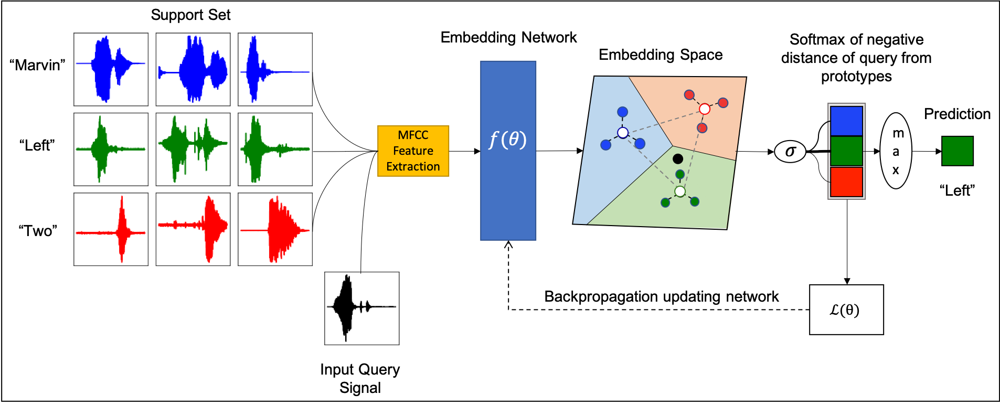